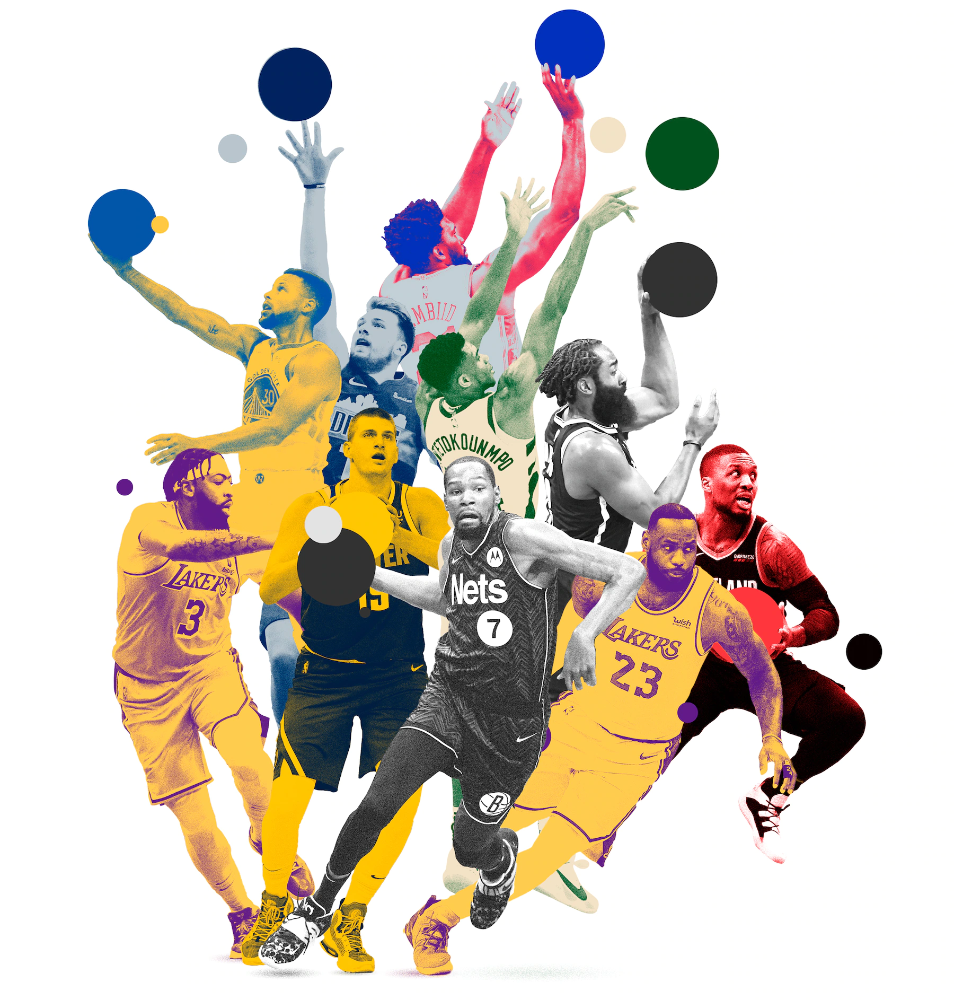

# <center>NBA SHOT SELECTION

____

### Datamites


- Name - Aiahwarya Patil
- Email - aishwarya22patil06@gmail.com
- Batch code - 27-MAR-23-CDS-PUN
- Project Id- PRCP-1008-NBAShotSelection
- Project Team Id - PTID-CDS-AUG-23-1623

____

## Problem Statement

Task 1:-Prepare a complete data analysis report on the given data.

Task 2:- Help all stakeholders develop more effective game strategies. The  goal is to find the best model that has the highest accuracy and F1-score.

Task 3:-Our objective is to build a shot prediction model, whether the player will score or not score, based on the circumstances under which they are made into consideration.    



____

# Dataset Link :

This data contains the location and circumstances of every field goal attempted by Kobe Bryant took during his 20-year career. Your task is to predict whether the basket went in (shot_made_flag).



Link :  https://d3ilbtxij3aepc.cloudfront.net/projects/CDS-Capstone-Projects/PRCP-1008-NBAShotSelection.zip


___

_**PROJECT PROCESS STEPS**_:
- 1). **Importing all the neccesary libraries**
- 2). **Understanding the data/ Insights from data**
- 3). **Exploratory Data Analysis (EDA)**
- 4). **Data Pre-processing**
- 5). **Feature Selection**
- 6). **Model Creation and Evaluation**
- 7). **Conclusion**

___

# Import Basic Libraries

In [1]:
# import libraries 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
warnings.filterwarnings('ignore')

## Reading CSV File

In [2]:
data=pd.read_csv('data.csv')

In [3]:
data

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
0,Jump Shot,Jump Shot,10,20000012,33.9723,167,72,-118.1028,10,1,...,2PT Field Goal,Right Side(R),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,1
1,Jump Shot,Jump Shot,12,20000012,34.0443,-157,0,-118.4268,10,1,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,2
2,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,1,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,3
3,Jump Shot,Jump Shot,43,20000012,33.8693,138,175,-118.1318,6,1,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,4
4,Driving Dunk Shot,Dunk,155,20000012,34.0443,0,0,-118.2698,6,2,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30692,Jump Shot,Jump Shot,397,49900088,33.9963,1,48,-118.2688,6,4,...,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30693
30693,Tip Shot,Tip Shot,398,49900088,34.0443,0,0,-118.2698,6,4,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30694
30694,Running Jump Shot,Jump Shot,426,49900088,33.8783,-134,166,-118.4038,3,4,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30695
30695,Jump Shot,Jump Shot,448,49900088,33.7773,31,267,-118.2388,2,4,...,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30696


____

# Domain Analysis

1.**ACTION TYPE** - There are several different types of shot that player can take.

2.**COMBINED SHOT TYPE** - Combination of two shots.

3.**GAME EVENT ID** - It will be used to get the game event data.

4.**GAME ID** - It is a unique sequence used to identify your player profile in free to play games.

5.**LAT AND LONG** - Lat and Long will give co-ordinates to the place where game happened.

6.**LOC_X** - X is left -right along the endline with 0 centered at the basket (negative numbers left of the basket if the basket is on the bottom of the chart).

7.**LOC_Y** - Y is positive towards halfcourt with 0 being at the basket (so very small negative numbers are possible, since the basket hangs just over the baseline).

8.**MINUTES REMAINING** - Minutes left in a given overall time.

9.**PERIOD** - A period in basketball is a block of time that a basketball game is made up of.There are four periods in an NBA game that last 12 minutes each.

10.**PLAYOFFS** - An additional match played to decide the outcome of a contest.

11.**SEASON** - In sports, a season is the part of one year that games of that sport are played.

12.**SECONDS REMAINING** - Seconds left in that minute.

13.**SHOT DISTANCE** - The shot is from the distance of an NBA three pointer (23 ft. 9 in.) Measures a team's point differential per 100 possessions.

14.**SHOT MADE FLAG** - Whether the player took a shot or not.

15.**SHOT TYPE** - In basketball, a field goal is a basket scored on any shot or tap other than a free throw, worth two or three points depending on the distance of the attempt from the basket.

16.**SHOT ZONE AREA** - The area of the field where player is able to take the shot at goal.

17.**SHOT ZONE BASIC** - With the use of only one hand, the shot should be released above the height of shoulder.

18.**SHOT ZONE RANGE** - Areas where they are most comfortable and confident in making shots.

19.**TEAM ID** - A TeamID is a unique identifier.

20.**TEAM NAME** - It is the name of a team in which player played for in a particular season.

21.**GAME DATE** - Date on which game happened.

22.**MATCHUP** - A sporting contest between two teams.

23.**OPPONENT** - Team that is competing against another team in a game.

24.**SHOT ID** - It is a unique id given to a particular shot.

____

# Basic Checks

In [4]:
data.head() #first 5 rows

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
0,Jump Shot,Jump Shot,10,20000012,33.9723,167,72,-118.1028,10,1,...,2PT Field Goal,Right Side(R),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,1
1,Jump Shot,Jump Shot,12,20000012,34.0443,-157,0,-118.4268,10,1,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,2
2,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,1,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,3
3,Jump Shot,Jump Shot,43,20000012,33.8693,138,175,-118.1318,6,1,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,4
4,Driving Dunk Shot,Dunk,155,20000012,34.0443,0,0,-118.2698,6,2,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,5


In [5]:
data.tail() #Last five rows

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
30692,Jump Shot,Jump Shot,397,49900088,33.9963,1,48,-118.2688,6,4,...,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30693
30693,Tip Shot,Tip Shot,398,49900088,34.0443,0,0,-118.2698,6,4,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30694
30694,Running Jump Shot,Jump Shot,426,49900088,33.8783,-134,166,-118.4038,3,4,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30695
30695,Jump Shot,Jump Shot,448,49900088,33.7773,31,267,-118.2388,2,4,...,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30696
30696,Jump Shot,Jump Shot,471,49900088,33.9723,1,72,-118.2688,0,4,...,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30697


In [6]:
data.shape #shape of the data

(30697, 25)

In [7]:
data.info() #getting information of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30697 entries, 0 to 30696
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   action_type         30697 non-null  object 
 1   combined_shot_type  30697 non-null  object 
 2   game_event_id       30697 non-null  int64  
 3   game_id             30697 non-null  int64  
 4   lat                 30697 non-null  float64
 5   loc_x               30697 non-null  int64  
 6   loc_y               30697 non-null  int64  
 7   lon                 30697 non-null  float64
 8   minutes_remaining   30697 non-null  int64  
 9   period              30697 non-null  int64  
 10  playoffs            30697 non-null  int64  
 11  season              30697 non-null  object 
 12  seconds_remaining   30697 non-null  int64  
 13  shot_distance       30697 non-null  int64  
 14  shot_made_flag      25697 non-null  float64
 15  shot_type           30697 non-null  object 
 16  shot

- The dataset contains total 25 features.

- The dataset contain the dtypes of int64,float64 and object

In [8]:
data.isnull().sum() #Checking Missing Values

action_type              0
combined_shot_type       0
game_event_id            0
game_id                  0
lat                      0
loc_x                    0
loc_y                    0
lon                      0
minutes_remaining        0
period                   0
playoffs                 0
season                   0
seconds_remaining        0
shot_distance            0
shot_made_flag        5000
shot_type                0
shot_zone_area           0
shot_zone_basic          0
shot_zone_range          0
team_id                  0
team_name                0
game_date                0
matchup                  0
opponent                 0
shot_id                  0
dtype: int64

- The shot_made_flag column is having the 5000 missing values.

# EXPLORATORY DATA ANALYSIS


- it is most important part of machine learning project 
 - In EDA we will do analysis about all the features in given dataset.
 - there is some step in EDA
    - Univariate analysis
    - Bivariate analysis
    - Multivariate analysis

### UNIVARIATE ANALAYSIS

In [9]:
integer_columns = data.select_dtypes(include=['int64','float64'])
integer_columns

,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,team_id,shot_id
0,10,20000012,33.9723,167,72,-118.1028,10,1,0,27,18,NaN,1610612747,1
1,12,20000012,34.0443,-157,0,-118.4268,10,1,0,22,15,0.0,1610612747,2
2,35,20000012,33.9093,-101,135,-118.3708,7,1,0,45,16,1.0,1610612747,3
3,43,20000012,33.8693,138,175,-118.1318,6,1,0,52,22,0.0,1610612747,4
4,155,20000012,34.0443,0,0,-118.2698,6,2,0,19,0,1.0,1610612747,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30692,397,49900088,33.9963,1,48,-118.2688,6,4,1,5,4,0.0,1610612747,30693
30693,398,49900088,34.0443,0,0,-118.2698,6,4,1,5,0,NaN,1610612747,30694
30694,426,49900088,33.8783,-134,166,-118.4038,3,4,1,28,21,1.0,1610612747,30695
30695,448,49900088,33.7773,31,267,-118.2388,2,4,1,10,26,0.0,1610612747,30696


In [10]:
numerical_cols=integer_columns.drop(['game_event_id','game_id','shot_made_flag','team_id','shot_id'],axis=1)
numerical_cols

,lat,loc_x,loc_y,lon,minutes_remaining,period,playoffs,seconds_remaining,shot_distance
0,33.9723,167,72,-118.1028,10,1,0,27,18
1,34.0443,-157,0,-118.4268,10,1,0,22,15
2,33.9093,-101,135,-118.3708,7,1,0,45,16
3,33.8693,138,175,-118.1318,6,1,0,52,22
4,34.0443,0,0,-118.2698,6,2,0,19,0
...,...,...,...,...,...,...,...,...,...
30692,33.9963,1,48,-118.2688,6,4,1,5,4
30693,34.0443,0,0,-118.2698,6,4,1,5,0
30694,33.8783,-134,166,-118.4038,3,4,1,28,21
30695,33.7773,31,267,-118.2388,2,4,1,10,26


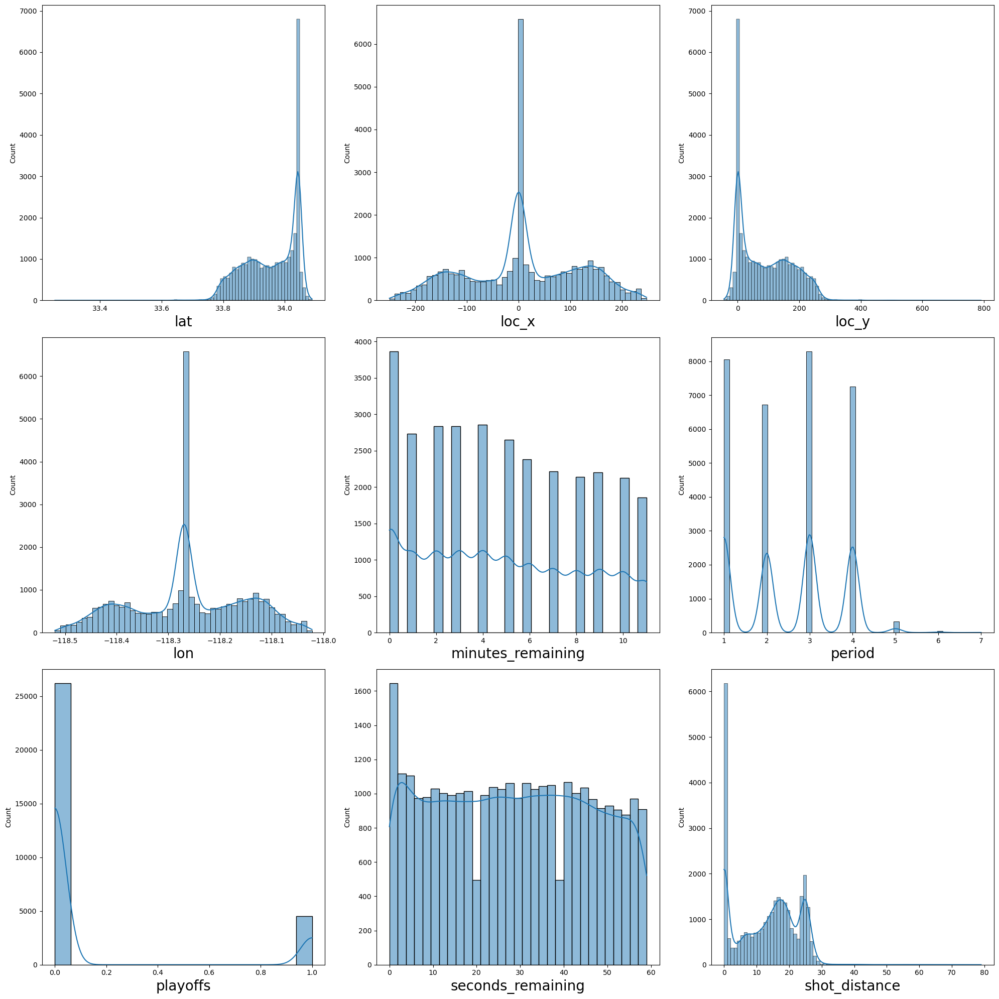

In [11]:
plt.figure(figsize=(20, 20), facecolor='white')#canvas size
plotnumber = 1#count variable

for columns in numerical_cols:#for loop to acess columns form data1
    if plotnumber<=9 :#checking whether count variable is less than 16 or not
        ax = plt.subplot(3, 3,plotnumber)#plotting 9 graphs in canvas(3 rows and 3 columns)
        sns.histplot(x=columns,data=numerical_cols,kde=True)
        plt.xlabel(columns,fontsize=20)#assigning name to x-axis and increasing it's font 
        plotnumber+=1#increasing counter
plt.tight_layout()

1. lat column is having left skewed distribution
2. loc_x column is having normal distribution
3. loc_y column is having right skewed distribution
4. lon column is having normal distribution.

In [12]:
cat_cols=data.drop(['action_type','combined_shot_type','season','shot_type','shot_zone_area','shot_zone_basic','shot_zone_range','team_name','opponent'],axis=1)
cat_cols

,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,team_id,game_date,matchup,shot_id
0,10,20000012,33.9723,167,72,-118.1028,10,1,0,27,18,NaN,1610612747,2000-10-31,LAL @ POR,1
1,12,20000012,34.0443,-157,0,-118.4268,10,1,0,22,15,0.0,1610612747,2000-10-31,LAL @ POR,2
2,35,20000012,33.9093,-101,135,-118.3708,7,1,0,45,16,1.0,1610612747,2000-10-31,LAL @ POR,3
3,43,20000012,33.8693,138,175,-118.1318,6,1,0,52,22,0.0,1610612747,2000-10-31,LAL @ POR,4
4,155,20000012,34.0443,0,0,-118.2698,6,2,0,19,0,1.0,1610612747,2000-10-31,LAL @ POR,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30692,397,49900088,33.9963,1,48,-118.2688,6,4,1,5,4,0.0,1610612747,2000-06-19,LAL vs. IND,30693
30693,398,49900088,34.0443,0,0,-118.2698,6,4,1,5,0,NaN,1610612747,2000-06-19,LAL vs. IND,30694
30694,426,49900088,33.8783,-134,166,-118.4038,3,4,1,28,21,1.0,1610612747,2000-06-19,LAL vs. IND,30695
30695,448,49900088,33.7773,31,267,-118.2388,2,4,1,10,26,0.0,1610612747,2000-06-19,LAL vs. IND,30696


In [13]:
cat_cols=data.select_dtypes(include=['object'])
cat_cols

,action_type,combined_shot_type,season,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_name,game_date,matchup,opponent
0,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Right Side(R),Mid-Range,16-24 ft.,Los Angeles Lakers,2000-10-31,LAL @ POR,POR
1,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,Los Angeles Lakers,2000-10-31,LAL @ POR,POR
2,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,Los Angeles Lakers,2000-10-31,LAL @ POR,POR
3,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,Los Angeles Lakers,2000-10-31,LAL @ POR,POR
4,Driving Dunk Shot,Dunk,2000-01,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,Los Angeles Lakers,2000-10-31,LAL @ POR,POR
...,...,...,...,...,...,...,...,...,...,...,...
30692,Jump Shot,Jump Shot,1999-00,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND
30693,Tip Shot,Tip Shot,1999-00,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND
30694,Running Jump Shot,Jump Shot,1999-00,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND
30695,Jump Shot,Jump Shot,1999-00,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND


In [14]:
categorical_cols=cat_cols.drop(['game_date','matchup'],axis=1)
categorical_cols

,action_type,combined_shot_type,season,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_name,opponent
0,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Right Side(R),Mid-Range,16-24 ft.,Los Angeles Lakers,POR
1,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,Los Angeles Lakers,POR
2,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,Los Angeles Lakers,POR
3,Jump Shot,Jump Shot,2000-01,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,Los Angeles Lakers,POR
4,Driving Dunk Shot,Dunk,2000-01,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,Los Angeles Lakers,POR
...,...,...,...,...,...,...,...,...,...
30692,Jump Shot,Jump Shot,1999-00,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,Los Angeles Lakers,IND
30693,Tip Shot,Tip Shot,1999-00,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,Los Angeles Lakers,IND
30694,Running Jump Shot,Jump Shot,1999-00,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,Los Angeles Lakers,IND
30695,Jump Shot,Jump Shot,1999-00,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,Los Angeles Lakers,IND


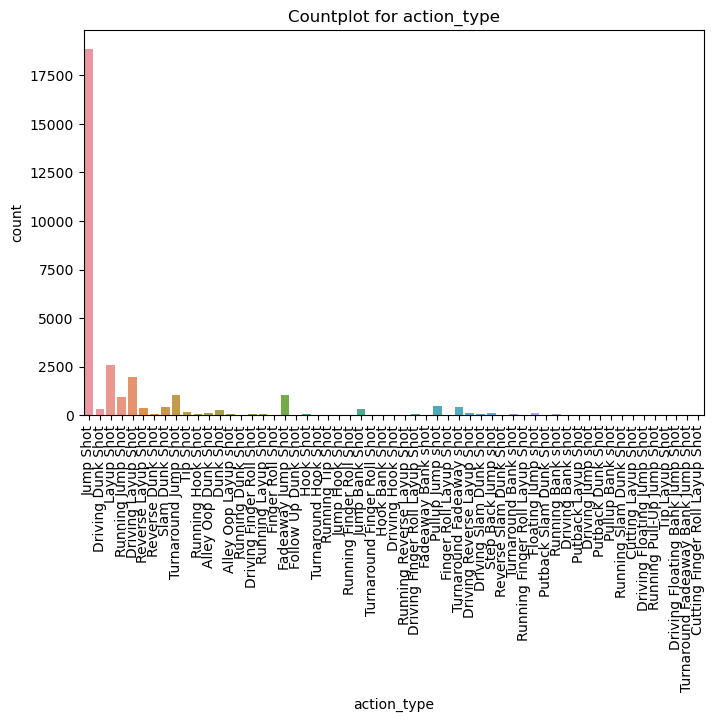

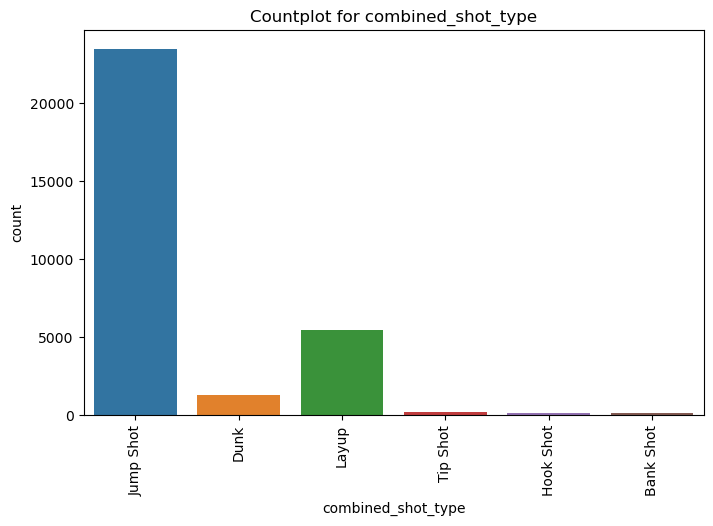

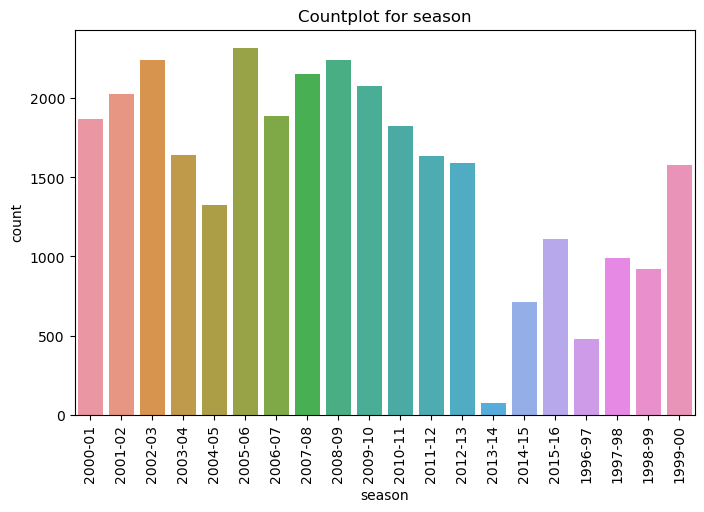

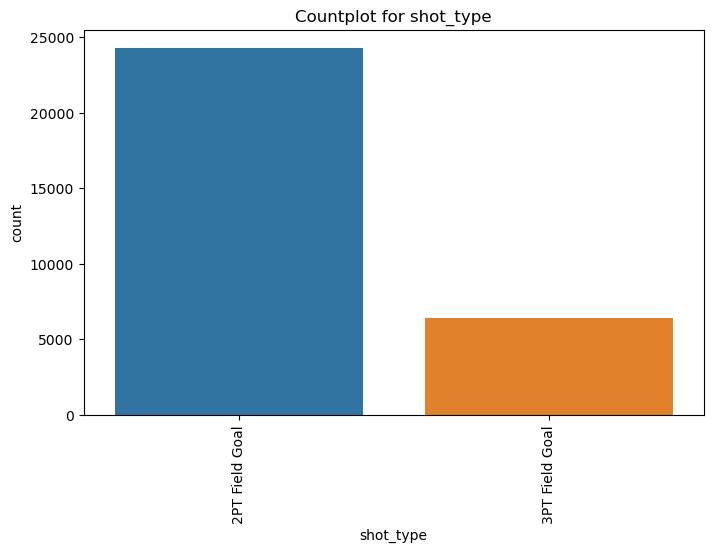

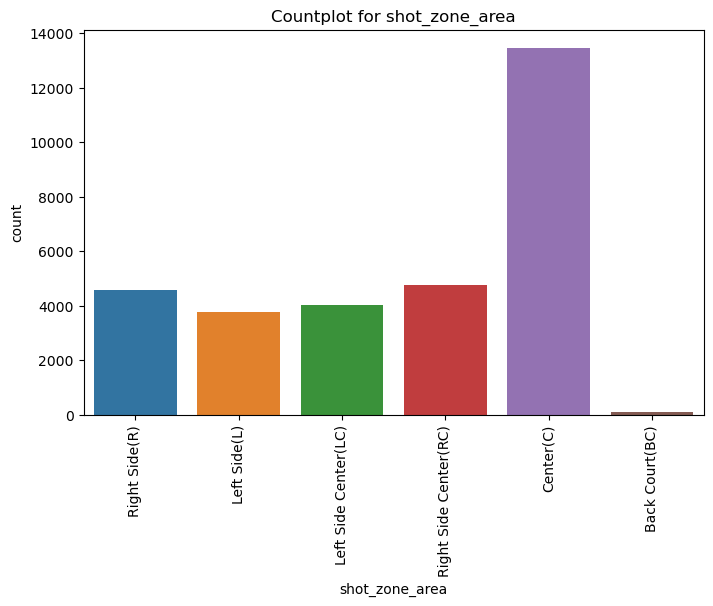

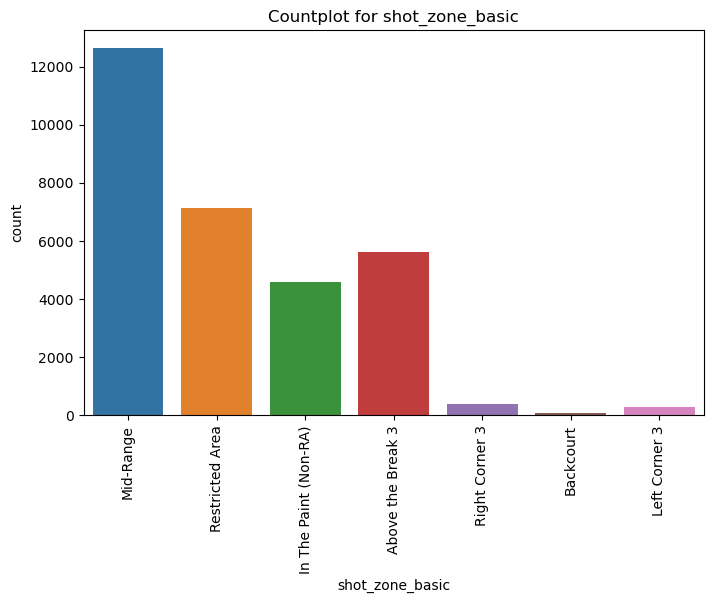

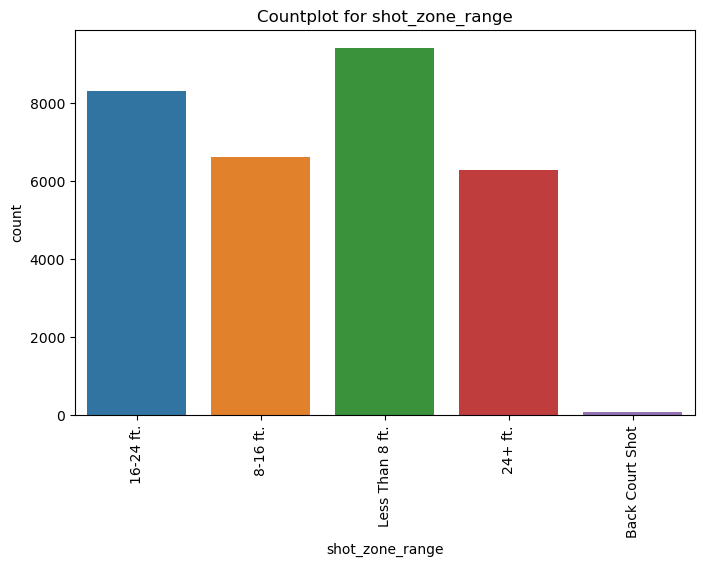

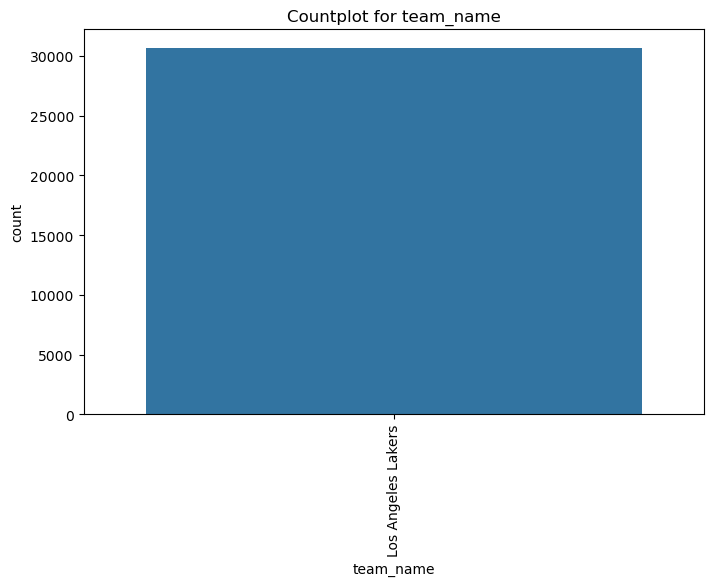

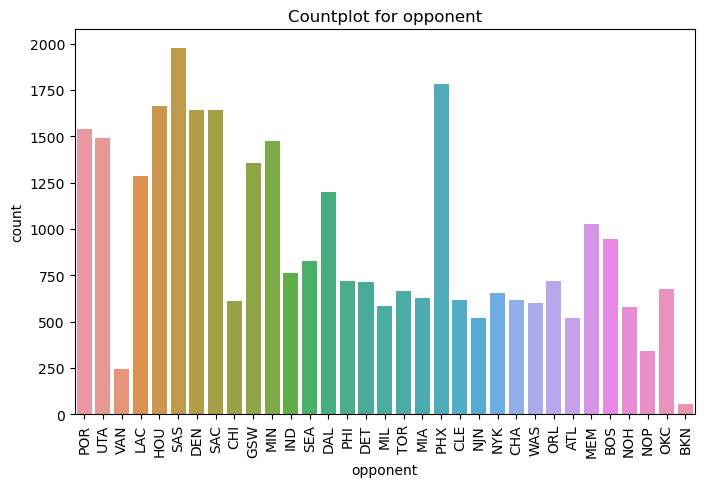

In [15]:
for column in categorical_cols:
    plt.figure(figsize=(8, 5))  # Adjust the figure size as needed
    sns.countplot(x=column, data=data)
    plt.title(f'Countplot for {column}')
    plt.xticks(rotation=90)
    plt.show()

insights

1. In action_type there are more than 18000 times player used jump shot.

2. Player used more than 20000 times jump shot along with combination of other shot.

3. In 2013-14 player made very less attempts for basket

4. Player made 2PT Field Goal majorly.

5. The majority attempts for basket made by the player from the center shot_zone_area.

6. The majority attempts for basket made by the player from the Mid-Range shot_zone_basic.

7. The majority attempts for basket made by the player less than 8ft.

8. Player played majority of games against SAS.

### BIVARIATE ANALYSIS

In [16]:
data.isnull().sum()

action_type              0
combined_shot_type       0
game_event_id            0
game_id                  0
lat                      0
loc_x                    0
loc_y                    0
lon                      0
minutes_remaining        0
period                   0
playoffs                 0
season                   0
seconds_remaining        0
shot_distance            0
shot_made_flag        5000
shot_type                0
shot_zone_area           0
shot_zone_basic          0
shot_zone_range          0
team_id                  0
team_name                0
game_date                0
matchup                  0
opponent                 0
shot_id                  0
dtype: int64

shot_made_flag is a target column and having 5000 missing values, since its target column and we are not going to impute missing values so for bivariate analysis we are removing the null values.


In [17]:
data=data.dropna(axis=0)

<AxesSubplot:xlabel='combined_shot_type', ylabel='action_type'>

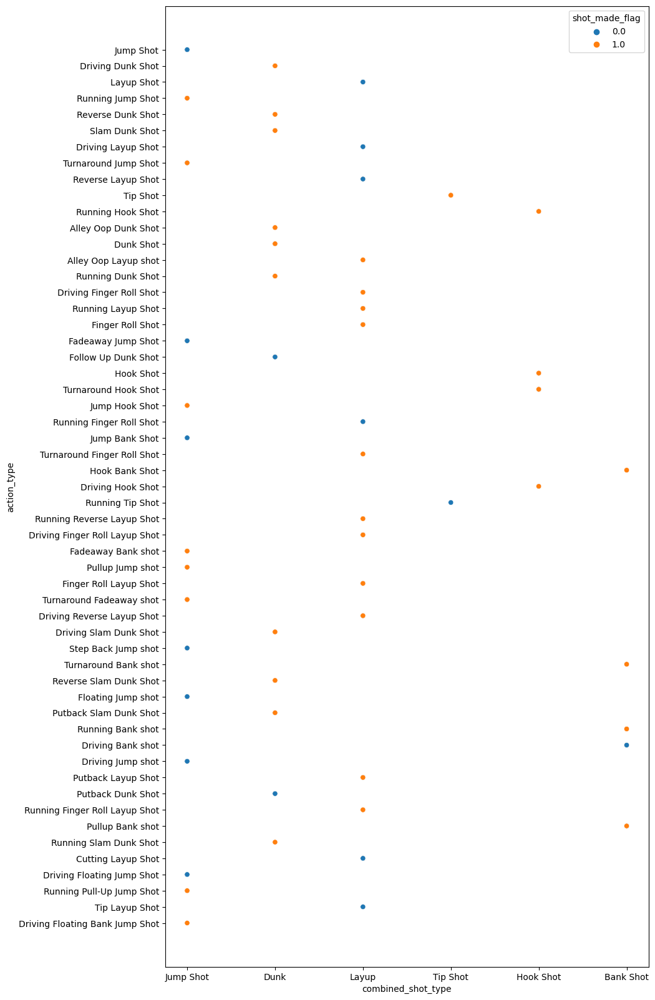

In [18]:
plt.figure(figsize=(10,20))

sns.scatterplot(y='action_type',x='combined_shot_type',hue='shot_made_flag',data=data)


Insights

1. If Hook Shot is attempted,then basket is made.
2. If Bank Shot is attempted,then 80% of basket.
3. If Tip Shot is attempted, then there is 50% chances of basket.
4. Majority of shots taken in Layup,Dunk and Jump Shot.
5. When player is used Layup as a combined_shot_type, ther is more chances of basket.
6. When player is used Dunk as a combined_shot_type, ther is more chances of basket.
7. When player is used Jump Shot as a combined_shot_type, there is 55% chances of basket.

<AxesSubplot:xlabel='loc_x', ylabel='loc_y'>

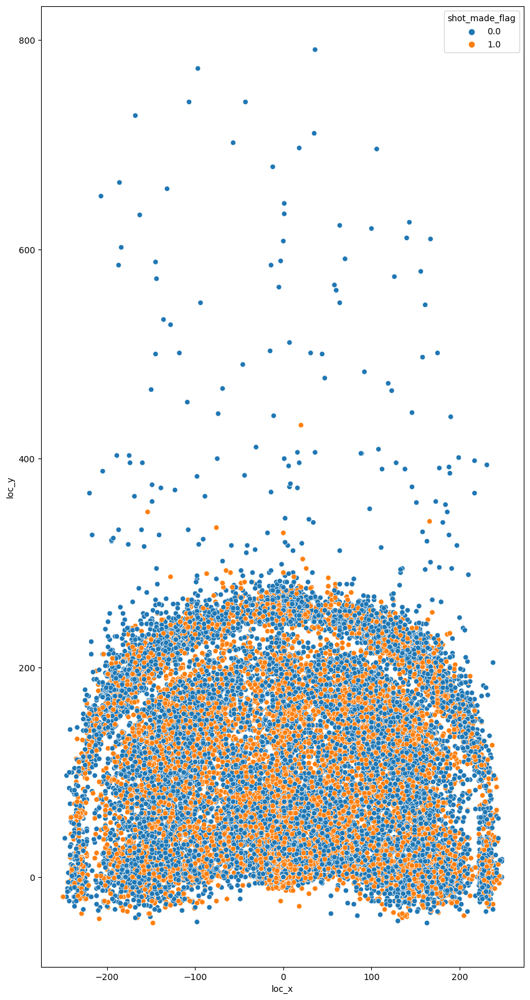

In [19]:
plt.figure(figsize=(10,20))
sns.scatterplot(x='loc_x',y='loc_y',hue='shot_made_flag',data=data)

Insights

1. If loc_y is greater than 400, there is 99% chances of no basket.
2. Majority of baskets have made when loc_y is less than 300.

<AxesSubplot:xlabel='lat', ylabel='lon'>

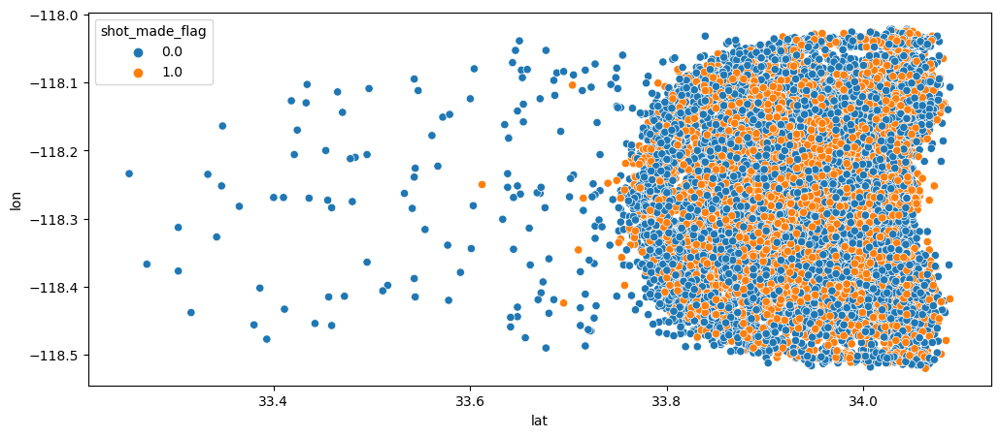

In [20]:
plt.figure(figsize=(12,5))
sns.scatterplot(x='lat',y='lon',hue='shot_made_flag',data=data)

<AxesSubplot:xlabel='count', ylabel='action_type'>

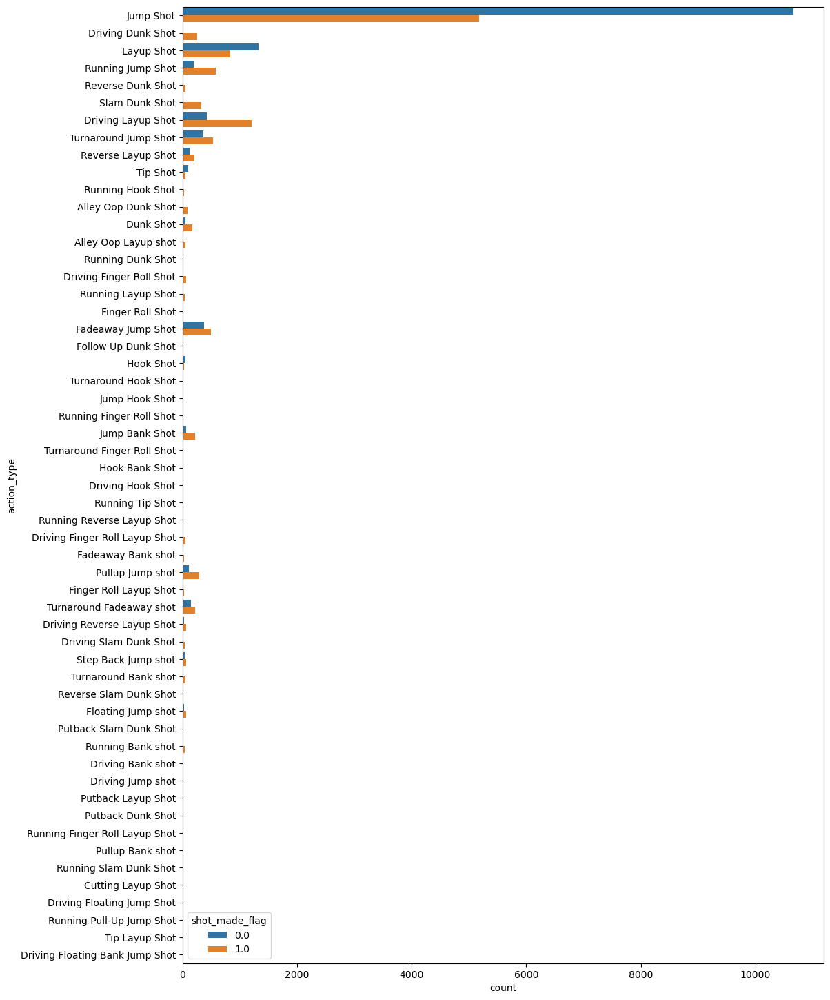

In [21]:
plt.figure(figsize=(12,18))
sns.countplot(y="action_type", hue="shot_made_flag", data=data)

Insights

1. The majority of shots are made by Jump Shot and the majority of baskets are made in Jump Shot(action_type).
2. The second highest baskets are made in Driving Layup Shot.
3. In Bank Shot and Dunk Shot very few attempts were made.

In [22]:
numerical_cols.columns

Index(['lat', 'loc_x', 'loc_y', 'lon', 'minutes_remaining', 'period',
       'playoffs', 'seconds_remaining', 'shot_distance'],
      dtype='object')

<AxesSubplot:xlabel='count', ylabel='shot_distance'>

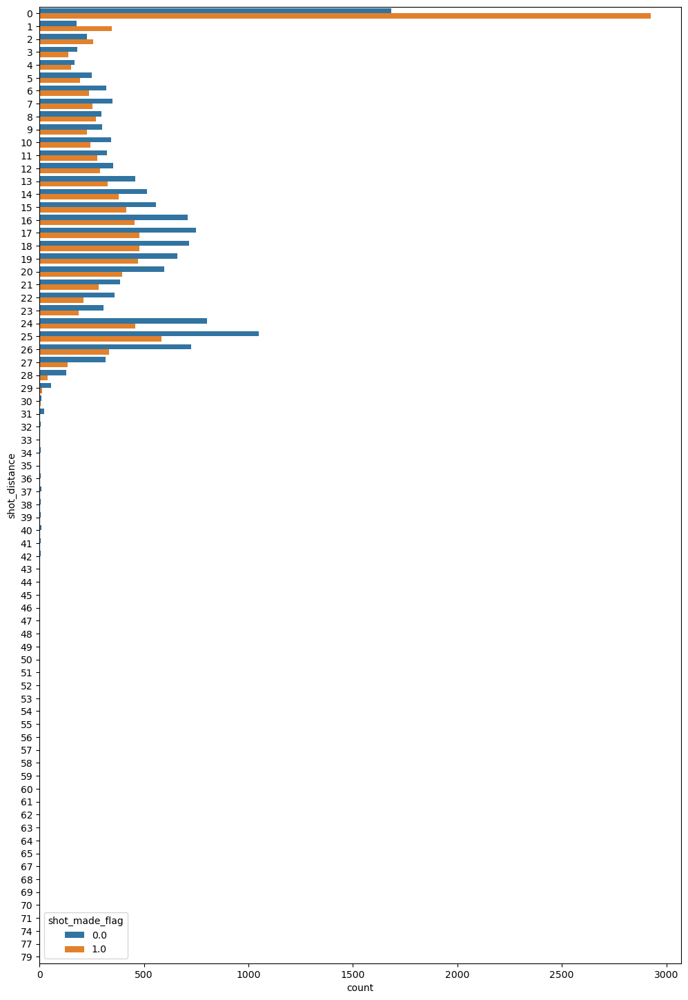

In [23]:
plt.figure(figsize=(12,18))
sns.countplot(y="shot_distance", hue="shot_made_flag", data=data)

Insights

1. If shot_distance is more than 30, then the player has made very less attempts.
2. If shot_distance is less than 1, then maximum attempts were made.
3. If shot_distance is 25,then second maximum attempts were made.
4. Around 95% shots were made if shot_ditance is less than 30.

In [24]:
data.columns

Index(['action_type', 'combined_shot_type', 'game_event_id', 'game_id', 'lat',
       'loc_x', 'loc_y', 'lon', 'minutes_remaining', 'period', 'playoffs',
       'season', 'seconds_remaining', 'shot_distance', 'shot_made_flag',
       'shot_type', 'shot_zone_area', 'shot_zone_basic', 'shot_zone_range',
       'team_id', 'team_name', 'game_date', 'matchup', 'opponent', 'shot_id'],
      dtype='object')

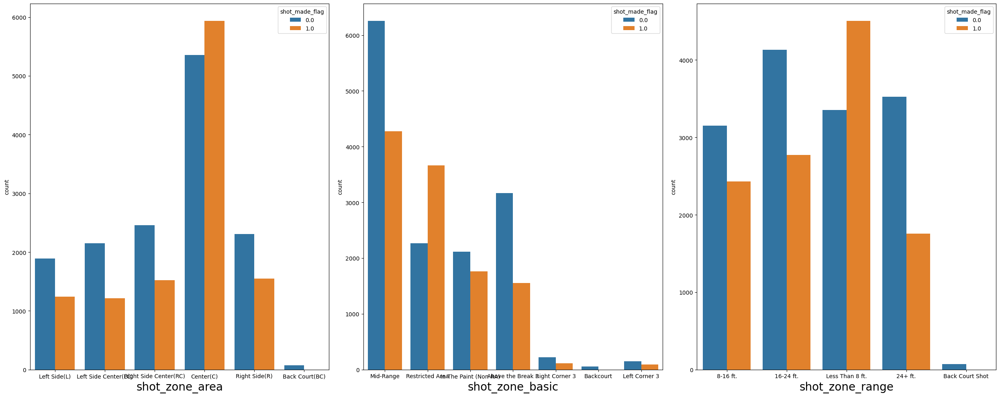

In [25]:
cat1_cols= data[['shot_zone_area', 'shot_zone_basic', 'shot_zone_range','shot_made_flag']]
plt.figure(figsize=(25, 10), facecolor='white')#canvas size
plotnumber = 1#count variable

for columns in cat1_cols:#for loop to acess columns form cat1_cols
    if plotnumber<=3 :#checking whether count variable is less than 11 or not
        ax = plt.subplot(1,3,plotnumber)#plotting 3 graphs in canvas(1 rows and 3 columns)
        sns.countplot(x=columns,data=cat1_cols,hue='shot_made_flag')
        plt.xlabel(columns,fontsize=20)#assigning name to x-axis and increasing it's font 
        plotnumber+=1#increasing counter
plt.tight_layout()


# MULTIVARIATE ANALYSIS

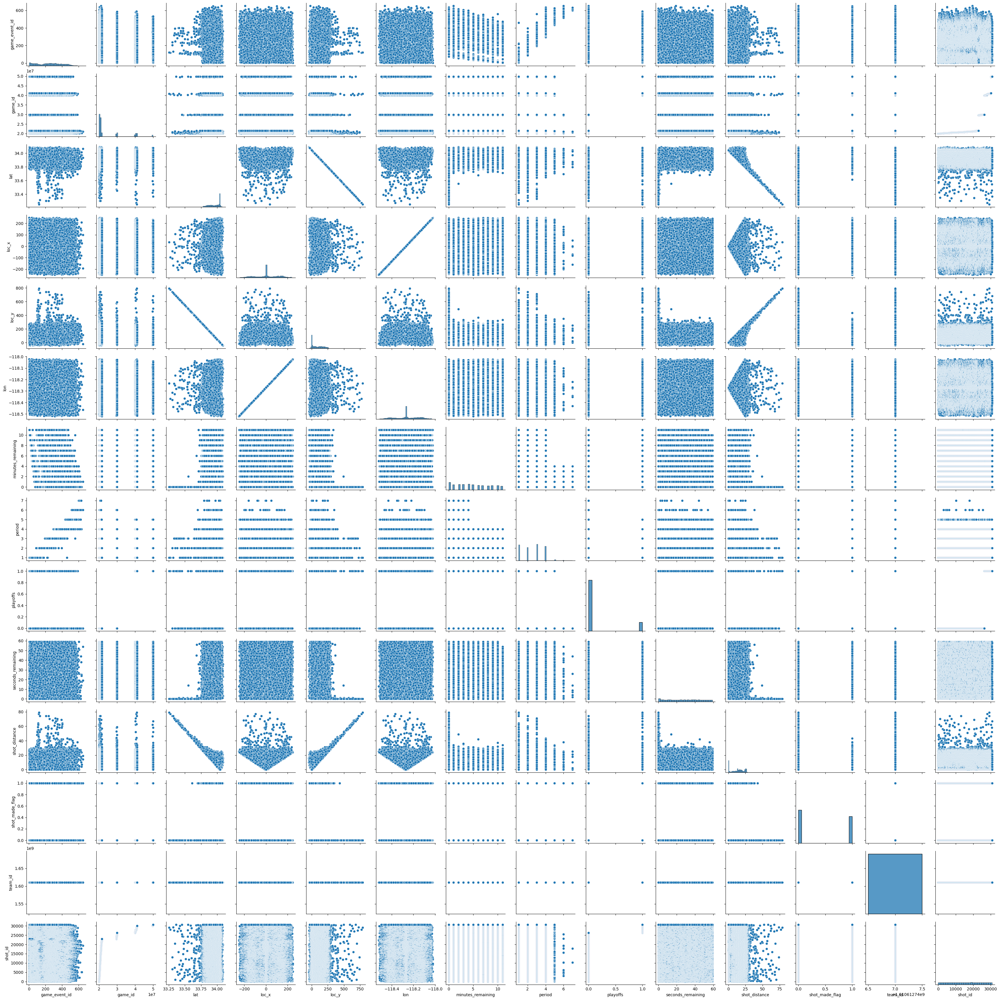

In [26]:
sns.pairplot(data)
plt.show()

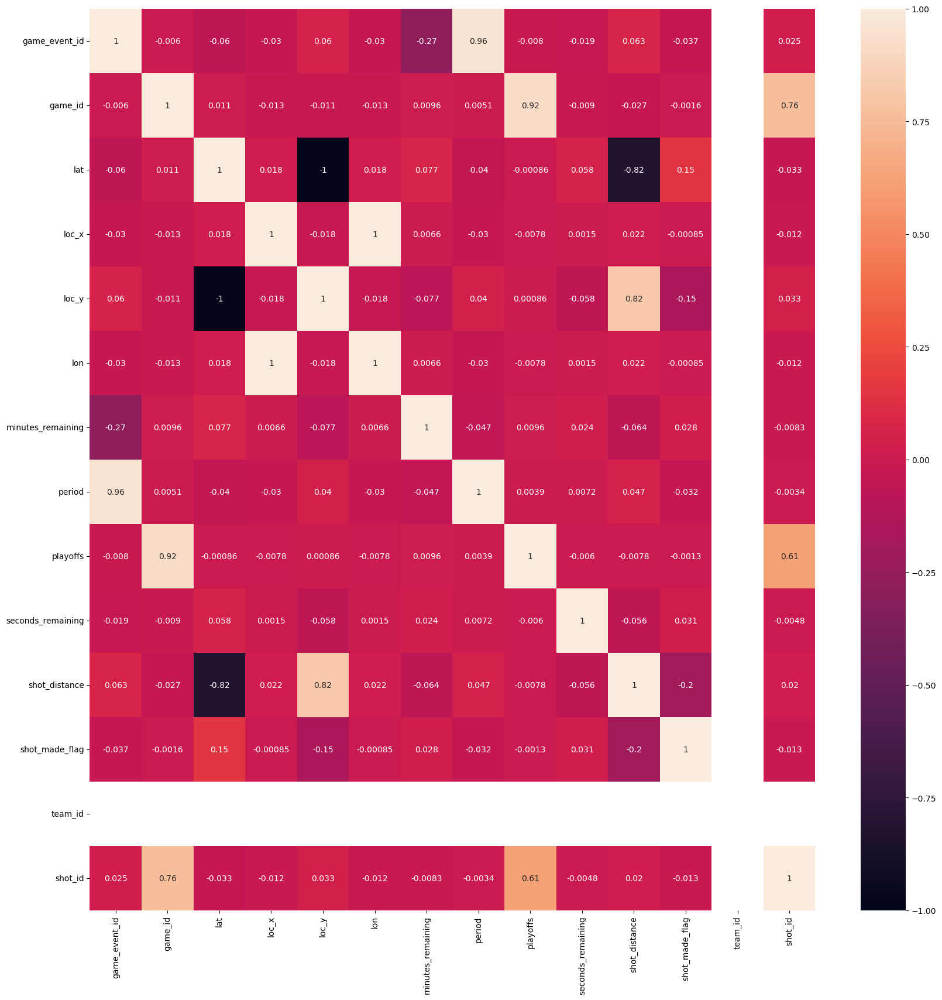

In [27]:
plt.figure(figsize=(20, 20), facecolor='white')
sns.heatmap(data=data.corr(),annot=True)
plt.show()

### Insights:

1. game_event_id is 96% correlated with period so, we are dropping game_event_id.
2. game_id is** 92%** correlated with playoffs so, we are dropping game_id.
3. lat is 100% negatively correlated with loc_y so, we are dropping lat.
4. lon is 100% negatively correlated with loc_x so, we are dropping lon.
5. team_id is highly correlated with every other feature so, we are dropping team_id.
6. shot_id have unique value for each record so, it dosen't impact on target variable.
7. season,team_name,game_date dosen't have impact on target variable.
8. matchup and opponent will give same information so, we are dropping matchup.


# DATA PREPROCESSING AND FEATURE ENGINEERING

## Handling Missing Values

In [28]:
data.isnull().sum()

action_type           0
combined_shot_type    0
game_event_id         0
game_id               0
lat                   0
loc_x                 0
loc_y                 0
lon                   0
minutes_remaining     0
period                0
playoffs              0
season                0
seconds_remaining     0
shot_distance         0
shot_made_flag        0
shot_type             0
shot_zone_area        0
shot_zone_basic       0
shot_zone_range       0
team_id               0
team_name             0
game_date             0
matchup               0
opponent              0
shot_id               0
dtype: int64

- There are no missing values.

In [29]:
df= data.drop(['game_event_id','game_id','lat','lon','team_id','shot_id','season','team_name','game_date','matchup'],axis=1)#,inplace=True)
df.head()

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent
1,Jump Shot,Jump Shot,-157,0,10,1,0,22,15,0.0,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,POR
2,Jump Shot,Jump Shot,-101,135,7,1,0,45,16,1.0,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,POR
3,Jump Shot,Jump Shot,138,175,6,1,0,52,22,0.0,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,POR
4,Driving Dunk Shot,Dunk,0,0,6,2,0,19,0,1.0,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,POR
5,Jump Shot,Jump Shot,-145,-11,9,3,0,32,14,0.0,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,POR


#### These are the columns we are dropping ('game_event_id','game_id','lat','lon','team_id','shot_id','season','team_name','game_date','matchup')

In [30]:
df.shape

(25697, 15)

## Handling Outliers

In [31]:
box= df.drop(['shot_type', 'shot_zone_area','shot_zone_basic', 'shot_zone_range', 'opponent','action_type','combined_shot_type'],axis=1)
box

,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag
1,-157,0,10,1,0,22,15,0.0
2,-101,135,7,1,0,45,16,1.0
3,138,175,6,1,0,52,22,0.0
4,0,0,6,2,0,19,0,1.0
5,-145,-11,9,3,0,32,14,0.0
...,...,...,...,...,...,...,...,...
30691,0,0,7,4,1,4,0,0.0
30692,1,48,6,4,1,5,4,0.0
30694,-134,166,3,4,1,28,21,1.0
30695,31,267,2,4,1,10,26,0.0


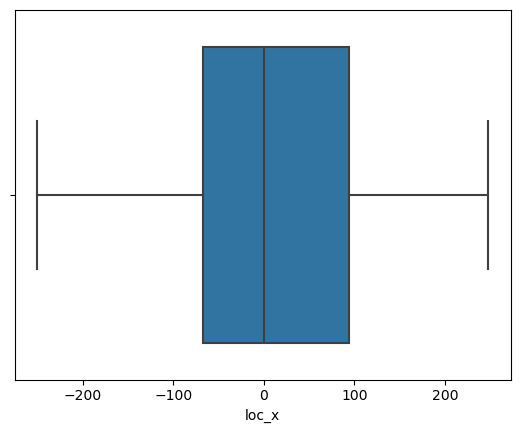

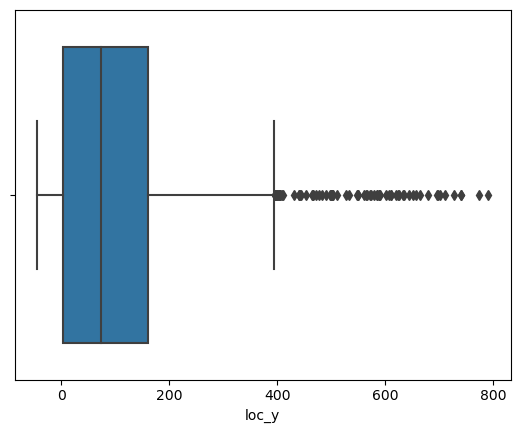

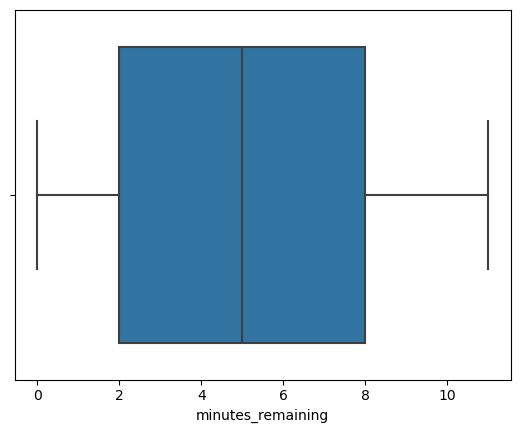

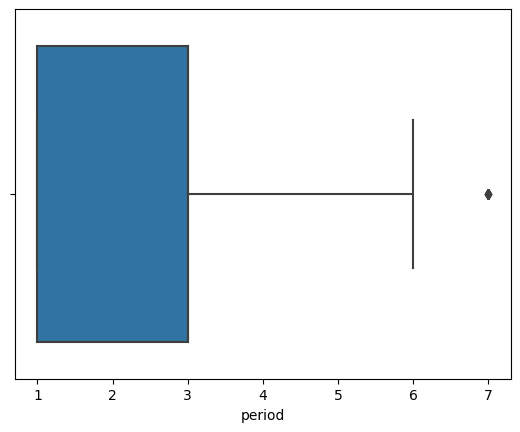

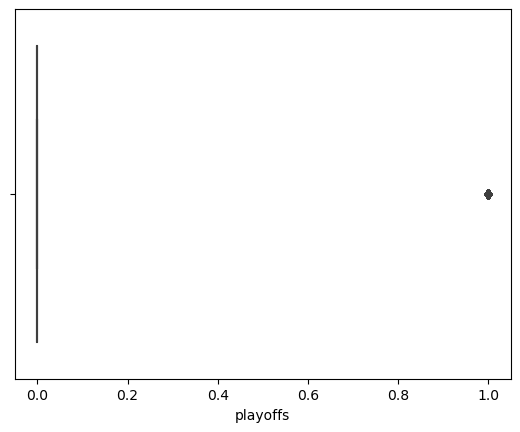

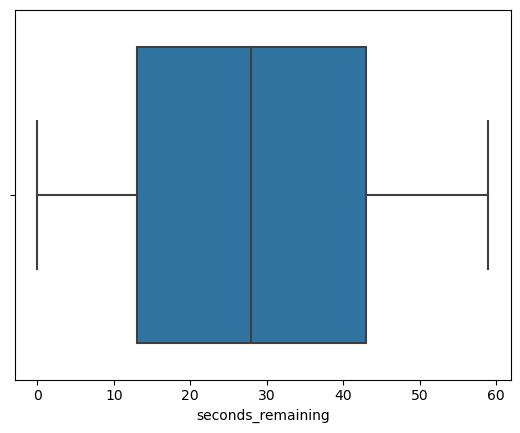

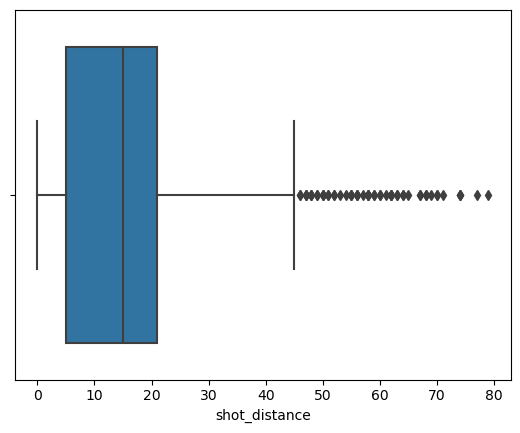

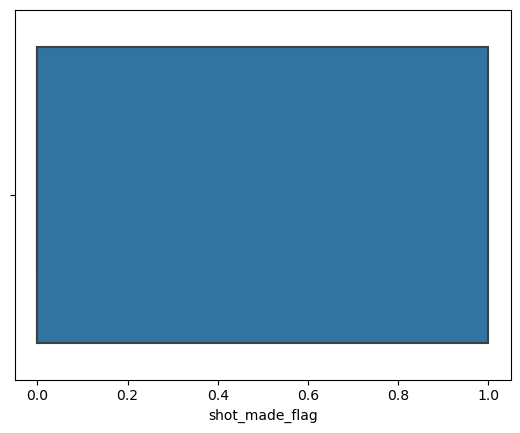

In [32]:
for columns in box:
  sns.boxplot(x= columns,data=box)
  plt.show()

The outliers in the data are 
(loc_y,period,playoffs,shot_distance)


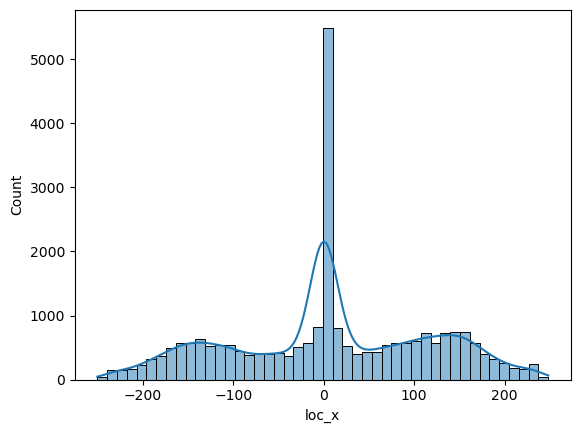

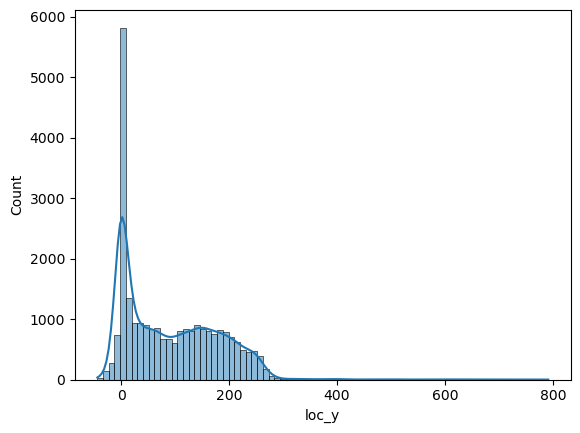

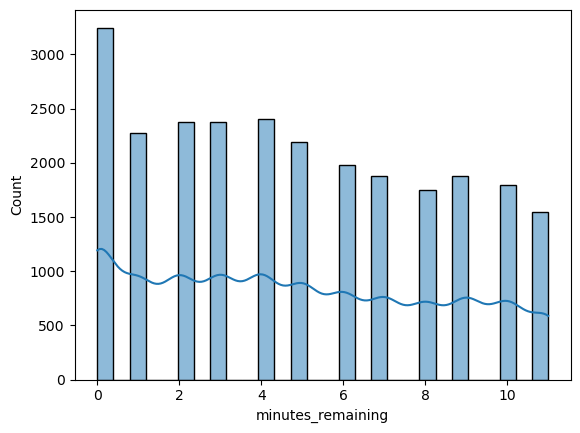

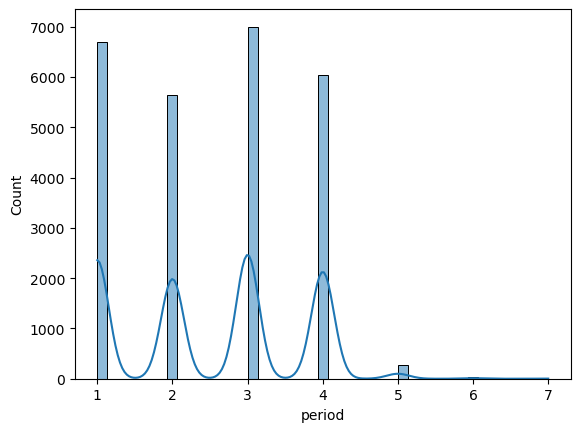

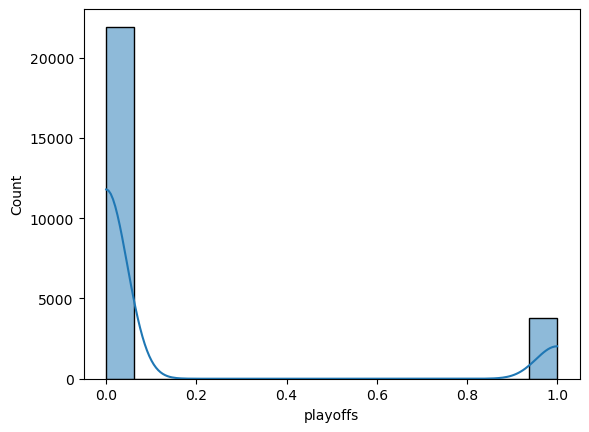

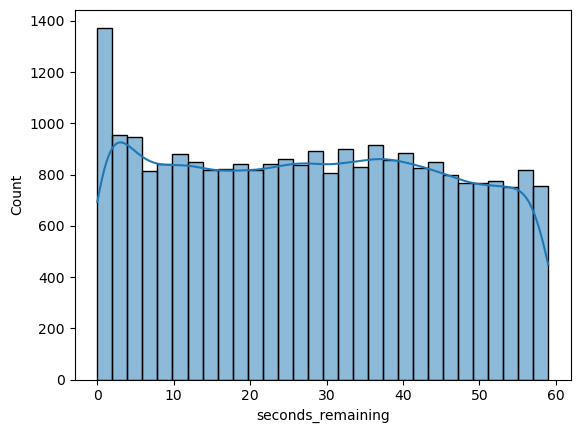

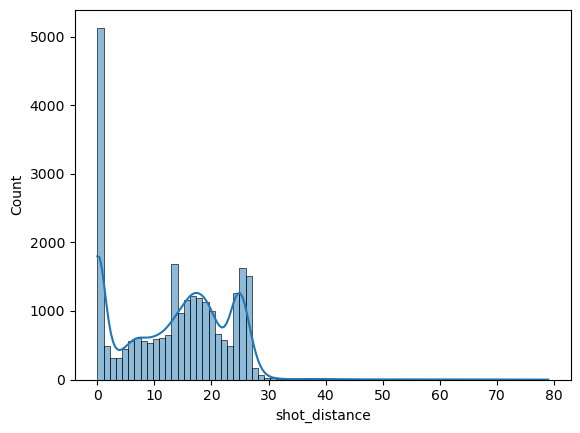

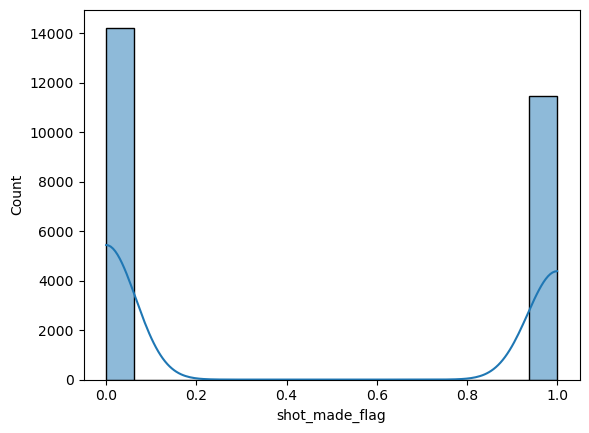

In [33]:
for columns in box:
  sns.histplot(x= columns,data=box,kde=True)
  plt.show()

# - loc_y

it is skewed distribution so, we use median.

In [34]:
from scipy import stats
IQR= stats.iqr(df.loc_y,interpolation='midpoint')
IQR

156.0

In [35]:
Q1= df.loc_y.quantile(0.25)
Q3= df.loc_y.quantile(0.75)
print(Q1)
Q3


4.0


160.0

In [36]:
low_limit= Q1- 1.5*IQR
upp_limit= Q3+ 1.5*IQR
print(low_limit)
upp_limit

-230.0


394.0

In [37]:
df.loc[df['loc_y']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent
177,Jump Shot,Jump Shot,47,477,0,2,0,0,47,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,SAC
313,Jump Shot,Jump Shot,108,409,0,3,0,0,42,0.0,3PT Field Goal,Back Court(BC),Above the Break 3,Back Court Shot,IND
322,Jump Shot,Jump Shot,-150,466,0,1,0,0,48,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,SEA
585,Jump Shot,Jump Shot,100,620,0,1,0,0,62,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,TOR
1073,Jump Shot,Jump Shot,106,696,0,2,0,0,70,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,PHX
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30047,Jump Shot,Jump Shot,64,623,0,1,1,0,62,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,UTA
30149,Jump Shot,Jump Shot,-109,454,0,1,1,0,46,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,UTA
30574,Jump Shot,Jump Shot,-3,589,0,2,1,0,58,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,POR
30612,Jump Shot,Jump Shot,158,497,0,1,1,0,52,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,IND


In [38]:
df.loc[df['loc_y']>upp_limit, 'loc_y']= np.median(df.loc_y)

In [39]:
df.loc[df['loc_y']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


In [40]:
df.loc[df['loc_y']<low_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


# Playoffs

In [41]:

IQR= stats.iqr(df.playoffs,interpolation='midpoint')
IQR

0.0

In [42]:
Q1= df.playoffs.quantile(0.25)
Q3= df.playoffs.quantile(0.75)
print(Q1)
Q3


0.0


0.0

In [43]:
low_limit= Q1- 1.5*IQR
upp_limit= Q3+ 1.5*IQR
print(low_limit)
upp_limit

0.0


0.0

In [44]:
df.loc[df['playoffs']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent
26198,Jump Shot,Jump Shot,-1,85,10,1,1,24,8,0.0,2PT Field Goal,Center(C),In The Paint (Non-RA),8-16 ft.,POR
26199,Jump Shot,Jump Shot,-109,179,7,1,1,35,20,0.0,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,POR
26200,Driving Layup Shot,Layup,0,0,5,1,1,36,0,0.0,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,POR
26201,Jump Shot,Jump Shot,161,141,5,2,1,41,21,0.0,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,POR
26202,Jump Shot,Jump Shot,-58,17,4,2,1,31,6,0.0,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,POR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30691,Driving Layup Shot,Layup,0,0,7,4,1,4,0,0.0,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,IND
30692,Jump Shot,Jump Shot,1,48,6,4,1,5,4,0.0,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,IND
30694,Running Jump Shot,Jump Shot,-134,166,3,4,1,28,21,1.0,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,IND
30695,Jump Shot,Jump Shot,31,267,2,4,1,10,26,0.0,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,IND


In [45]:
df.loc[df['playoffs']>upp_limit, 'playoffs']= np.median(df.playoffs)

In [46]:
df.loc[df['playoffs']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


In [47]:
df.loc[df['playoffs']<low_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


# shot_distance

It is rightly skewed distribution.

In [48]:
from scipy import stats
IQR= stats.iqr(df.shot_distance,interpolation='midpoint')
IQR

16.0

In [49]:
Q1= df.shot_distance.quantile(0.25)
Q3= df.shot_distance.quantile(0.75)
print(Q1)
Q3

5.0


21.0

In [50]:
low_limit= Q1- 1.5*IQR
upp_limit= Q3+ 1.5*IQR
print(low_limit)
upp_limit

-19.0


45.0

In [51]:
df.loc[df['shot_distance']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent
177,Jump Shot,Jump Shot,47,74,0,2,0,0,47,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,SAC
322,Jump Shot,Jump Shot,-150,74,0,1,0,0,48,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,SEA
585,Jump Shot,Jump Shot,100,74,0,1,0,0,62,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,TOR
1073,Jump Shot,Jump Shot,106,74,0,2,0,0,70,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,PHX
1605,Jump Shot,Jump Shot,-145,74,0,3,0,0,60,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,MEM
2523,Jump Shot,Jump Shot,60,74,0,3,0,0,56,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,POR
3211,Jump Shot,Jump Shot,64,74,0,1,0,0,55,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,BOS
3553,Jump Shot,Jump Shot,-118,74,0,3,0,0,51,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,MEM
3715,Jump Shot,Jump Shot,-207,74,0,3,0,0,68,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,PHI
4077,Jump Shot,Jump Shot,-69,74,0,1,0,0,47,0.0,3PT Field Goal,Back Court(BC),Backcourt,Back Court Shot,SAC


In [52]:
len(df.loc[df['shot_distance']>upp_limit])

57

In [53]:
df.loc[df['shot_distance']>upp_limit, 'shot_distance']= np.median(df.shot_distance)

In [54]:
df.loc[df['shot_distance']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


In [55]:
df.loc[df['shot_distance']<low_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


## period

In [56]:

from scipy import stats
IQR= stats.iqr(df.period,interpolation='midpoint')
IQR

2.0

In [57]:
Q1= df.period.quantile(0.25)
Q3= df.period.quantile(0.75)
print(Q1)
Q3

1.0


3.0

In [58]:
low_limit= Q1- 1.5*IQR
upp_limit= Q3+ 1.5*IQR
print(low_limit)
upp_limit

-2.0


6.0

In [59]:
df.loc[df['period']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent
10250,Running Layup Shot,Layup,0,0,2,7,0,7,0,1.0,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,CHA
10251,Jump Shot,Jump Shot,-6,250,1,7,0,2,25,0.0,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,CHA
17833,Tip Shot,Tip Shot,1,20,4,7,0,4,2,0.0,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,PHX
17834,Jump Shot,Jump Shot,-71,208,3,7,0,26,21,0.0,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,PHX
17835,Jump Shot,Jump Shot,-161,200,2,7,0,9,25,1.0,3PT Field Goal,Left Side Center(LC),Above the Break 3,24+ ft.,PHX
17836,Jump Shot,Jump Shot,50,173,0,7,0,44,18,0.0,2PT Field Goal,Center(C),Mid-Range,16-24 ft.,PHX
17837,Floating Jump shot,Jump Shot,-81,72,0,7,0,14,10,1.0,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,PHX


In [60]:
df.loc[df['period']>upp_limit, 'period']= np.median(df.period)

In [61]:
df.loc[df['period']>upp_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


In [62]:
df.loc[df['period']<low_limit]

,action_type,combined_shot_type,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,opponent


# Scaling Data

## Scalilng is not required for our dataset as, there is no much variation in values.

# CATEGORICAL ENCODING

## Label Encoding

In [63]:
df.select_dtypes(exclude='number').columns

Index(['action_type', 'combined_shot_type', 'shot_type', 'shot_zone_area',
       'shot_zone_basic', 'shot_zone_range', 'opponent'],
      dtype='object')

In [64]:
from sklearn.preprocessing import LabelEncoder
lc=LabelEncoder()
df.shot_type=lc.fit_transform(df.shot_type)
df.shot_zone_range=lc.fit_transform(df.shot_zone_range)

## One-Hot-Encoding

In [65]:
df=pd.get_dummies(data=df,drop_first=True)

In [66]:
df.shape

(25697, 112)

# MODEL CREATION

In [67]:
X=df.drop(['shot_made_flag'],axis=1)
y=df.shot_made_flag

In [68]:
X

,loc_x,loc_y,minutes_remaining,period,playoffs,seconds_remaining,shot_distance,shot_type,shot_zone_range,action_type_Alley Oop Layup shot,...,opponent_PHI,opponent_PHX,opponent_POR,opponent_SAC,opponent_SAS,opponent_SEA,opponent_TOR,opponent_UTA,opponent_VAN,opponent_WAS
1,-157,0,10,1,0,22,15,0,2,0,...,0,0,1,0,0,0,0,0,0,0
2,-101,135,7,1,0,45,16,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,138,175,6,1,0,52,22,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,6,2,0,19,0,0,4,0,...,0,0,1,0,0,0,0,0,0,0
5,-145,-11,9,3,0,32,14,0,2,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30691,0,0,7,4,0,4,0,0,4,0,...,0,0,0,0,0,0,0,0,0,0
30692,1,48,6,4,0,5,4,0,4,0,...,0,0,0,0,0,0,0,0,0,0
30694,-134,166,3,4,0,28,21,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30695,31,267,2,4,0,10,26,1,1,0,...,0,0,0,0,0,0,0,0,0,0


## Train-Test-Split

In [69]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=33)

In [70]:
y_train.value_counts()

0.0    10736
1.0     8536
Name: shot_made_flag, dtype: int64

# BALANCING THE DATA

In [71]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()

In [72]:
X_sm, y_sm = sm.fit_resample(X_train,y_train)

Counter is a container which keeps track to how many times equivalent values are added. Python counter class is a part of collections module and is a subclass of dictionary.

Actual Classes Counter({0.0: 10736, 1.0: 8536})
SMOTE Classes Counter({1.0: 10736, 0.0: 10736})


<AxesSubplot:xlabel='shot_made_flag', ylabel='Count'>

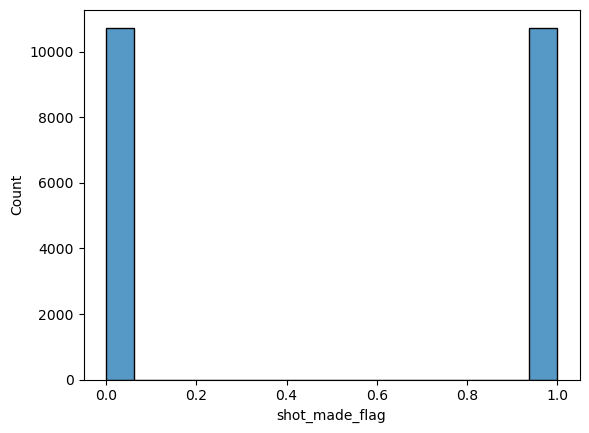

In [73]:
from collections import Counter
print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_sm))
sns.histplot(y_sm)

In [74]:
y_sm.value_counts() #data is balanced

1.0    10736
0.0    10736
Name: shot_made_flag, dtype: int64

# LOGISTIC REGRESSION

In [75]:
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(X_sm,y_sm)

LogisticRegression()

In [76]:
y_pred=clf.predict(X_test)
y_pred

array([0., 0., 0., ..., 1., 0., 1.])

In [77]:
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,\
precision_score,classification_report,f1_score

In [78]:
pd.crosstab(y_test,y_pred)

col_0,0.0,1.0
shot_made_flag,,
0.0,2646,850
1.0,1365,1564


In [79]:
cr=classification_report(y_test,y_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.66      0.76      0.70      3496
         1.0       0.65      0.53      0.59      2929

    accuracy                           0.66      6425
   macro avg       0.65      0.65      0.65      6425
weighted avg       0.65      0.66      0.65      6425



In [80]:
y_train_predict=clf.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=clf.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.6669616244411326
test_score 0.6552529182879377


# DECISON TREE CLASSIFIER

In [81]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree

dt=DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf= 1, min_samples_split= 3, splitter= 'random')#object creation for decision tree  
dt.fit(X_sm,y_sm)#training the model
y_hat=dt.predict(X_test)
y_hat

array([0., 0., 0., ..., 0., 0., 1.])

In [82]:
cr2=classification_report(y_test,y_hat)
print(cr2)

              precision    recall  f1-score   support

         0.0       0.65      0.85      0.74      3496
         1.0       0.72      0.46      0.56      2929

    accuracy                           0.67      6425
   macro avg       0.68      0.65      0.65      6425
weighted avg       0.68      0.67      0.66      6425



In [83]:
y_train_predict=dt.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=dt.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.6855439642324889
test_score 0.671284046692607


# RANDOM FOREST CLASSIFIER

In [84]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(n_estimators=100)    #object creation ,taking 100 decision tree in random forest 
rf_clf.fit(X_sm,y_sm)

RandomForestClassifier()

In [85]:
y_p=rf_clf.predict(X_test)
y_p

array([1., 0., 0., ..., 0., 0., 1.])

In [86]:
cr1=classification_report(y_test,y_p)
print(cr1)

              precision    recall  f1-score   support

         0.0       0.64      0.73      0.68      3496
         1.0       0.62      0.52      0.56      2929

    accuracy                           0.63      6425
   macro avg       0.63      0.62      0.62      6425
weighted avg       0.63      0.63      0.63      6425



In [87]:
y_train_predict=rf_clf.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=rf_clf.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.9995808494783904
test_score 0.6331517509727627


# KNN CLASSIFIER

In [88]:
from sklearn.neighbors import KNeighborsClassifier

In [89]:
knn = KNeighborsClassifier(n_neighbors=18)
knn.fit(X_sm,y_sm) 
y_pred = knn.predict(X_test)
y_pred

array([0., 0., 1., ..., 1., 0., 0.])

In [90]:
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,\
precision_score,classification_report,f1_score
print("The accuracy score is : ", accuracy_score(y_test,y_pred))

The accuracy score is :  0.565136186770428


In [91]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.59      0.65      0.62      3496
         1.0       0.53      0.47      0.49      2929

    accuracy                           0.57      6425
   macro avg       0.56      0.56      0.56      6425
weighted avg       0.56      0.57      0.56      6425



In [92]:
y_train_predict=knn.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=knn.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.6440014903129657
test_score 0.565136186770428


# BAGGING CLASSIFIER

In [93]:
from sklearn.ensemble import BaggingClassifier #import bagging 


model_bagg1=BaggingClassifier() 


model_bagg1.fit(X_sm,y_sm) 


y_hat_bagg=model_bagg1.predict(X_test)

In [94]:
f1_bagg=f1_score(y_test,y_hat_bagg,average='weighted')
f1_bagg

0.6088409329027104

In [95]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

         0.0       0.62      0.75      0.68      3496
         1.0       0.61      0.46      0.52      2929

    accuracy                           0.62      6425
   macro avg       0.61      0.60      0.60      6425
weighted avg       0.62      0.62      0.61      6425



In [96]:
y_train_predict=model_bagg1.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=model_bagg1.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.9808587928464978
test_score 0.617431906614786


# XGBClassifier

In [97]:
from xgboost import XGBClassifier

xgb_r= XGBClassifier() 
xgb_r.fit(X_sm,y_sm)
y_hat=xgb_r.predict(X_test)

In [98]:
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,\
precision_score,classification_report,f1_score
f1_xgb= f1_score(y_test,y_hat)
f1_xgb

0.5700392743594539

In [99]:
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

         0.0       0.65      0.74      0.69      3496
         1.0       0.63      0.52      0.57      2929

    accuracy                           0.64      6425
   macro avg       0.64      0.63      0.63      6425
weighted avg       0.64      0.64      0.64      6425



In [100]:
y_train_predict=xgb_r.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=xgb_r.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.7942902384500745
test_score 0.6421789883268483


# AdaBoost Classifier

In [101]:
from sklearn.ensemble import AdaBoostClassifier
ada_clf = AdaBoostClassifier().fit(X_sm,y_sm)
ada_clf

AdaBoostClassifier()

In [102]:
ada_pred= ada_clf.predict(X_test)

In [103]:
ada_cm= confusion_matrix(y_test,ada_pred)
ada_cm

array([[2895,  601],
       [1517, 1412]], dtype=int64)

In [104]:
print(classification_report(y_test,ada_pred))

              precision    recall  f1-score   support

         0.0       0.66      0.83      0.73      3496
         1.0       0.70      0.48      0.57      2929

    accuracy                           0.67      6425
   macro avg       0.68      0.66      0.65      6425
weighted avg       0.68      0.67      0.66      6425



In [105]:
y_train_predict=ada_clf.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=ada_clf.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.6876862891207154
test_score 0.6703501945525292


# GradientBoostingClassifier

In [106]:
from sklearn.ensemble import GradientBoostingClassifier
gbc_clf = GradientBoostingClassifier().fit(X_sm,y_sm)
gbc_clf

GradientBoostingClassifier()

In [107]:
gbc_pred= gbc_clf.predict(X_test)

In [108]:
gbc_cm= confusion_matrix(y_test,gbc_pred)
gbc_cm

array([[2943,  553],
       [1551, 1378]], dtype=int64)

In [109]:
gbc_accuracy=accuracy_score(y_test,gbc_pred)
gbc_accuracy

0.6725291828793775

In [110]:
print(classification_report(y_test,gbc_pred))

              precision    recall  f1-score   support

         0.0       0.65      0.84      0.74      3496
         1.0       0.71      0.47      0.57      2929

    accuracy                           0.67      6425
   macro avg       0.68      0.66      0.65      6425
weighted avg       0.68      0.67      0.66      6425



In [111]:
y_train_predict=gbc_clf.predict(X_sm)
train_score=accuracy_score(y_sm,y_train_predict)
print('train_score',train_score)

##prediciton on test data

y_test_predict=gbc_clf.predict(X_test)
test_score=accuracy_score(y_test,y_test_predict)
print('test_score',test_score)

train_score 0.680933308494784
test_score 0.6725291828793775


# HYPER PARAMETER TUNING

-  By using Hyperparameter it will Prevent Overfitting, underfitting and Optimize Performance

## Logistic Regression

In [112]:
from sklearn.model_selection import GridSearchCV

In [113]:
lr_param = {
    "penalty" : ['l2'], # L1 or L2 (Regularization penality)
    "C"       : list(np.logspace(-3, 3, 7)), # Inverse of regularization strength
    'solver'  : ['liblinear', 'saga'],
    'max_iter': [100, 200, 300]
}

In [114]:
lr_reg = LogisticRegression(random_state=42)

In [115]:
lr_random_cv = GridSearchCV(lr_reg, lr_param, cv=3, verbose=1, n_jobs=-1)
lr_random_cv.fit(X_sm, y_sm)


Fitting 3 folds for each of 42 candidates, totalling 126 fits


GridSearchCV(cv=3, estimator=LogisticRegression(random_state=42), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],
                         'max_iter': [100, 200, 300], 'penalty': ['l2'],
                         'solver': ['liblinear', 'saga']},
             verbose=1)

In [116]:
lr_hyper = lr_random_cv.best_params_
lr_hyper

{'C': 1.0, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}

In [117]:
best_lr = LogisticRegression(random_state=42,**lr_hyper)

In [118]:
best_lr.fit(X_sm,y_sm)

LogisticRegression(random_state=42, solver='liblinear')

In [119]:
lr_accuracy1 = best_lr.score(X_sm,y_sm)
print("Accuracy on Test Data:", lr_accuracy1)

Accuracy on Test Data: 0.7123230253353204


## Dicision Tree

In [120]:
from sklearn.model_selection import GridSearchCV
params = {
    "criterion":("gini", "entropy"), 
    "splitter":("best", "random"), 
    "max_depth":(list(range(1, 20))), 
    "min_samples_split":[2, 3, 4],    
    "min_samples_leaf":list(range(1, 20)),
}


tree_clf = DecisionTreeClassifier(random_state=3)   #object creation for decision tree with random state 3
tree_cv = GridSearchCV(tree_clf, params, scoring="f1", n_jobs=-1, verbose=1, cv=3)

tree_cv.fit(X_sm,y_sm)
best_params = tree_cv.best_params_
print(f"Best paramters: {best_params})")


Fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Best paramters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'})


In [121]:
tree_cv.best_params_

{'criterion': 'gini',
 'max_depth': 1,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [122]:
tree_cv.best_score_

0.628057396264547

In [123]:
dt1=DecisionTreeClassifier(criterion= 'gini', max_depth= 1, min_samples_leaf= 1, min_samples_split= 2, splitter= 'best')


In [124]:
dt1.fit(X_sm,y_sm)
y_p_tr = dt1.predict(X_test)
y_p_tr

array([0., 0., 0., ..., 1., 0., 1.])

In [125]:
f1_dt1=f1_score(y_test,y_p_tr)
f1_dt1

0.5870129870129871

In [126]:
print(classification_report(y_test,y_p_tr))

              precision    recall  f1-score   support

         0.0       0.66      0.75      0.70      3496
         1.0       0.64      0.54      0.59      2929

    accuracy                           0.65      6425
   macro avg       0.65      0.64      0.64      6425
weighted avg       0.65      0.65      0.65      6425



## Random Forest Classifier

In [127]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],         # Maximum depth of individual trees
    'min_samples_split': [2, 5, 10],         # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],           # Minimum samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider for the best split
    'bootstrap': [True, False]               # Whether to use bootstrap samples
}


In [128]:
# Create a Random Forest Classifier
random_forest = RandomForestClassifier(random_state=42)

# Perform grid search with cross-validation
grid_search = GridSearchCV(random_forest, param_grid, cv=3, verbose=1, n_jobs=-1)
grid_search.fit(X_sm, y_sm)

Fitting 3 folds for each of 648 candidates, totalling 1944 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 10, 20, 30],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             verbose=1)

In [129]:
# Get the best hyperparameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [130]:
 #Evaluate the model on the test set
test_accuracy = best_model.score(X_sm, y_sm)

In [131]:
print("Best Hyperparameters:", best_params)
print("Test Accuracy:", test_accuracy)

Best Hyperparameters: {'bootstrap': True, 'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}
Test Accuracy: 0.7438524590163934


## XGB classifier

In [132]:
from sklearn.model_selection import RandomizedSearchCV


In [133]:
param_grid = {
    'n_estimators': np.arange(50, 300, 50),
    'max_depth': np.arange(3, 10),
    'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'min_child_weight': np.arange(1, 10),
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
}

In [134]:
# Create an XGBoost Classifier
xgb = XGBClassifier()

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(
    xgb,
    param_distributions=param_grid,
    n_iter=100,  # Number of random combinations to try
    scoring='accuracy',  # Use an appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    verbose=2,
    n_jobs=-1,  # Use all available CPU cores
    random_state=42,
)

In [135]:
# Perform the hyperparameter search
random_search.fit(X_sm,y_sm)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                   n_iter=100, n_jobs=-1,
                   param_distributions={'colsample_by

In [107]:
# Print the best hyperparameters
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Hyperparameters: {'subsample': 0.7, 'n_estimators': 250, 'min_child_weight': 6, 'max_depth': 8, 'learning_rate': 0.01, 'gamma': 0, 'colsample_bytree': 0.6}
Best Score: 0.6790723390734452


## Ada Boost Classifier

In [124]:
# Define the hyperparameter grid with a range of values for tuning
ada_param_grid = {
    'n_estimators': [50, 100, 150, 200],       # Number of base estimators
    'learning_rate': [0.01, 0.1, 0.2, 0.3],    # Learning rate for weight adjustment
    'base_estimator__max_depth': [1, 2, 3],    # Maximum depth of base decision tree
}

# Initialize a base estimator with a max_depth
base_est = DecisionTreeClassifier(max_depth=1)  # Example base estimator
ada_clf2 = AdaBoostClassifier(base_estimator=base_est, random_state=42)

In [125]:
# Initialize RandomizedSearchCV for hyperparameter tuning
ada_random_search = RandomizedSearchCV(
    estimator            =ada_clf2,      # Base model
    param_distributions  =ada_param_grid,# Hyperparameter grid for search
    scoring              ='accuracy',    # Scoring metric for evaluation
    n_iter               =100,           # Number of random combinations to try
    cv                   =5,             # Number of cross-validation folds
    verbose              =1,             # Verbosity level for output
    random_state         =42,            # Random seed for reproducibility
    n_jobs               =-1             # Number of CPU cores to use for parallel processing
)


In [126]:
# Fit the RandomizedSearchCV object of training data
ada_random_search.fit(X_sm, y_sm)

# Get the best hyperparameters
ada_best_param = ada_random_search.best_params_
print("Best Hyperparameters:", ada_best_param)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best Hyperparameters: {'n_estimators': 50, 'learning_rate': 0.3, 'base_estimator__max_depth': 2}


In [127]:
# Create an AdaBoost classifier with the best hyperparameters
ada_classifier = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=ada_best_param['base_estimator__max_depth']),
                                         n_estimators=ada_best_param['n_estimators'],
                                         learning_rate=ada_best_param['learning_rate'],
                                         random_state=42)


In [128]:
# Train the best classifier on the training data
ada_classifier.fit(X_sm,y_sm)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2),
                   learning_rate=0.3, random_state=42)

In [129]:
ada_predict= ada_classifier.predict(X_test)

In [130]:
accuracy_ada_clf = accuracy_score(y_test,ada_predict)
accuracy_ada_clf

0.6739299610894942

In [131]:
# Evaluate the model on the test data (you can use accuracy, F1-score, or other metrics)
accuracy_ad = ada_classifier.score(X_sm, y_sm)
print("Accuracy on Test Data:", accuracy_ad)

Accuracy on Test Data: 0.6795361400894188


# GradientBoostingClassifier

In [133]:
# Define the parameter grid for Gradient Boosting
param_grid = {
    'n_estimators': np.arange(50, 300, 50),
    'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5],
    'max_depth': np.arange(3, 10),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
    'subsample': [0.7, 0.8, 0.9, 1.0],
}

In [134]:
# Create a Gradient Boosting classifier
gradient_boost = GradientBoostingClassifier()

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(
    gradient_boost,
    param_distributions=param_grid,
    n_iter=100,  # Number of random combinations to try
    scoring='accuracy',  # Use an appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    verbose=2,
    n_jobs=-1,  # Use all available CPU cores
    random_state=42,
)

In [135]:
# Perform the hyperparameter search
random_search.fit(X_sm, y_sm)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.1, 0.2, 0.3,
                                                          0.5],
                                        'max_depth': array([3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'n_estimators': array([ 50, 100, 150, 200, 250]),
                                        'subsample': [0.7, 0.8, 0.9, 1.0]},
                   random_state=42, scoring='accuracy', verbose=2)

In [136]:
# Print the best hyperparameters
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Hyperparameters: {'subsample': 0.7, 'n_estimators': 200, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_depth': 8, 'learning_rate': 0.01}
Best Score: 0.6780943276835913


___

# <center> - CONCLUSION -

# CHALLENGES FACED

- Finding ways to pre-process data and removing all the useless columns present in the dataset before shot prediction.

- Exploring different ways to predict the missing shot values.

- Training and testing data for prediction accurately.

___

### - In this project we have to predict whether the player will score or not score, based on the circumstances under which they are made into consideration,for that i used different ML Algorithms:-

  - 1. Logistic Regression
  - 2. Decision Tree Classifier
  - 3. Random Forest classifier
  - 4. KNN Classifier
  - 5. Bagging Classifier
  - 6. XGB Classifier 
  - 7. AdaBoost Classifier 
  - 8. GradientBoosting Classifier 

____

### Out of these Algorithms,following Algorithms perfomed better than others:

  - 1. Logistic Regression
  - 2. XGB Classifier 
  - 3. AdaBoost Classifier 
  - 4. GradientBoosting Classifier 

____

### RESULTS:

- _The LOGISTIC REGRESSION model has the highest accuracy after performing hyperparameter tuning, indicating the best fit to the data among all models._              


- _The GradientBoosting Classifier model has also a perfect score but Logistic Regression model perfomed well after hyperparameter tuning._                                                                                           


- _XGB and AdaBoost models also have good performance but relatively lower accuracy than Logesitic regression model ._  


- _Random forest classifier model has variation after performing hyperparameter tuning ._


_____

# BEST MODEL :

- After Hyperparameter tuning I found that **LOGISTIC REGRESSION** giving well accuracy (71%) on data as compare to all models, so We have choose this model for future prediction.

____

## <center> Thank You

___